In [1]:
import os
import json
import torch
from torch.utils.data import DataLoader
import torchvision
import torchvision.models as models
import numpy as np
import cv2
import utils
import trainer
import evaluator
import data_process
import motion_blur
import matplotlib.pyplot as plt

# Set random seed for reproducibility
seed = 211
np.random.seed(seed)
torch.manual_seed(seed)

In [2]:
data_process.download_data()

input_size = 448

transform = torchvision.transforms.Compose([
    torchvision.transforms.Resize((input_size, input_size)),
    torchvision.transforms.ToTensor(), # uint8 values in [0, 255] -> float tensor with values [0, 1]
    torchvision.transforms.Normalize(mean=data_process.train_mean.tolist(), std=data_process.train_std.tolist())
])

train_set, val_set, test_set = data_process.load_data(transform=transform, input_size=input_size)

test_set_uni_001 = data_process.NoisySubset(test_set, noise_fn=motion_blur.motion_blur, noise_params={'kernel_type': 'uniform', 'a': 0.01})
test_set_uni_005 = data_process.NoisySubset(test_set, noise_fn=motion_blur.motion_blur, noise_params={'kernel_type': 'uniform', 'a': 0.05})
test_set_uni_01 = data_process.NoisySubset(test_set, noise_fn=motion_blur.motion_blur, noise_params={'kernel_type': 'uniform', 'a': 0.1})
test_set_elli_001 = data_process.NoisySubset(test_set, noise_fn=motion_blur.motion_blur, noise_params={'kernel_type': 'ellipse', 'a': 0.01})
test_set_elli_005 = data_process.NoisySubset(test_set, noise_fn=motion_blur.motion_blur, noise_params={'kernel_type': 'ellipse', 'a': 0.05})
test_set_elli_01 = data_process.NoisySubset(test_set, noise_fn=motion_blur.motion_blur, noise_params={'kernel_type': 'ellipse', 'a': 0.1})
test_set_nat = data_process.NoisySubset(test_set, noise_fn=motion_blur.motion_blur, noise_params={'kernel_type': 'natural'})

Data already exists

Number of valid images: 664
Train set size: 464 - 69.88%
Validation set size: 67 - 10.09%
Test set size: 133 - 20.03%



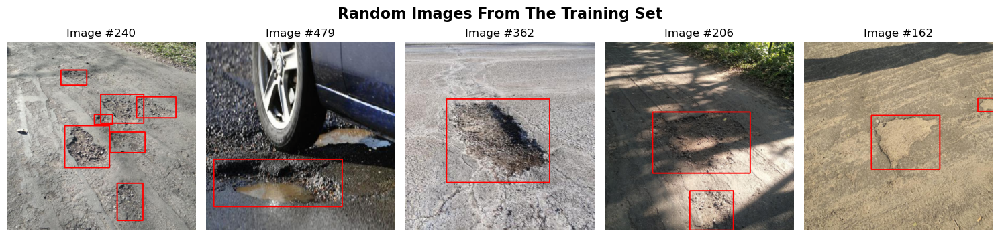

In [4]:
# Display 5 random images from the training set
train_loader = DataLoader(train_set, batch_size=5, shuffle=True, collate_fn=data_process.collate_fn)
images, targets = next(iter(train_loader))
data_process.show_images(images, targets, title="Random Images From The Training Set")

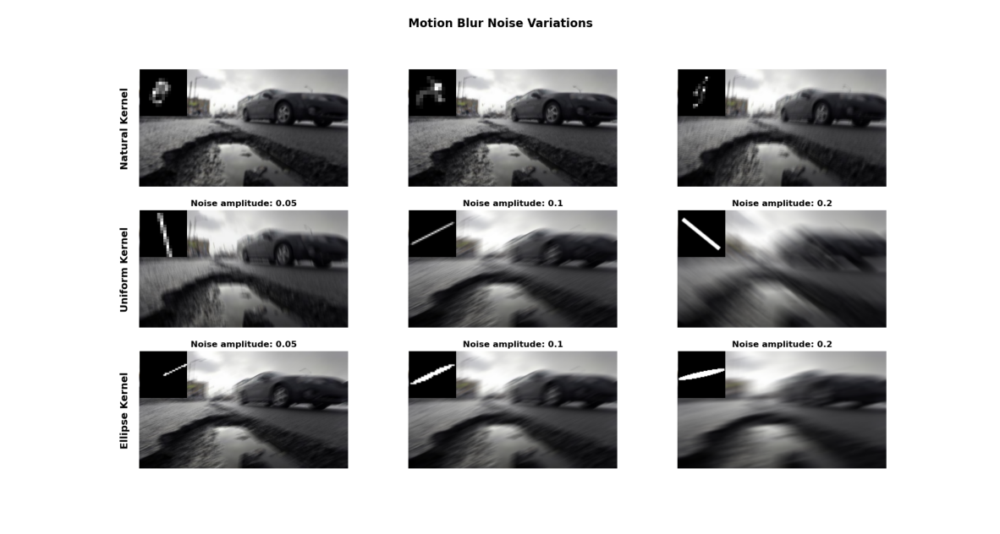

In [5]:
#show noise types
image = cv2.imread("data/motion_blur_data/motion_blur_types.png")
# Convert BGR to RGB for matplotlib
image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# Display using matplotlib
plt.figure(figsize=(15, 15))
plt.imshow(image_rgb)
plt.axis('off')  # Turn off axis
plt.title("", fontsize=16)
plt.show()

In [3]:
# Train with data augmentation:
history = trainer.train_from_config(model_config_path="data/models/retinanet_resnet50_fpn_v2/retinanet_resnet50_fpn_v2_best_params.json", train_set=train_set, val_set=val_set, save_path="data/models/retinanet_resnet50_fpn_v2", kornia_aug=False)

Starting training for retinanet_resnet50_fpn_v2 with the following parameters:
{'batch_size': 4, 'epochs': 19, 'preweight_mode': 'fine_tuning', 'optimizer': 'Adam', 'lr': 0.00013306848141706506, 'beta1': 0.9068693027594908, 'beta2': 0.9382663514975078, 'scheduler': 'CosineAnnealingLR', 'T_max': 9, 'eta_min': 2.2865560690366153e-07}
Epoch 1/19, Train Loss: 78.5785, Val mAP@50: 0.4053, FPS: 59.92, Epoch Time: 22.01 seconds


Epoch 2/19, Train Loss: 46.2812, Val mAP@50: 0.6283, FPS: 60.88, Epoch Time: 21.74 seconds
Epoch 3/19, Train Loss: 30.6002, Val mAP@50: 0.6815, FPS: 60.58, Epoch Time: 21.77 seconds
Epoch 4/19, Train Loss: 22.4881, Val mAP@50: 0.6158, FPS: 61.06, Epoch Time: 21.76 seconds
Epoch 5/19, Train Loss: 16.6574, Val mAP@50: 0.6636, FPS: 61.29, Epoch Time: 21.78 seconds
Epoch 6/19, Train Loss: 12.7377, Val mAP@50: 0.6705, FPS: 61.20, Epoch Time: 21.79 seconds
Epoch 7/19, Train Loss: 10.0326, Val mAP@50: 0.6569, FPS: 61.56, Epoch Time: 21.77 seconds
Epoch 8/19, Train Loss: 8.1908, Val mAP@50: 0.7003, FPS: 61.37, Epoch Time: 21.72 seconds
Epoch 9/19, Train Loss: 7.1089, Val mAP@50: 0.6803, FPS: 61.40, Epoch Time: 21.78 seconds
Epoch 10/19, Train Loss: 6.9082, Val mAP@50: 0.6792, FPS: 61.90, Epoch Time: 21.89 seconds
Epoch 11/19, Train Loss: 6.8964, Val mAP@50: 0.6797, FPS: 61.97, Epoch Time: 22.07 seconds
Epoch 12/19, Train Loss: 6.7228, Val mAP@50: 0.6478, FPS: 62.13, Epoch Time: 22.14 seconds
E

Mean Average Precision @ 0.5 : 0.6062 FPS: 61.94


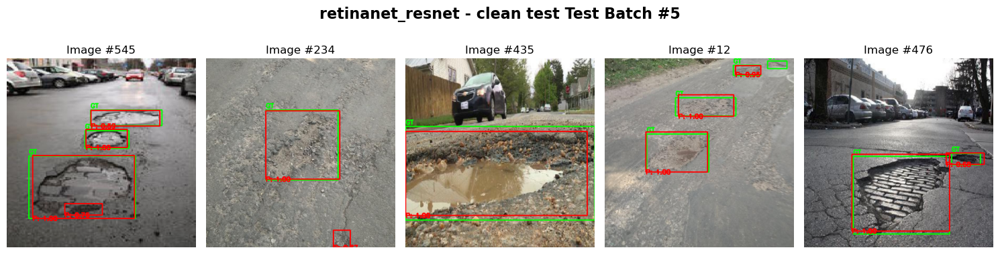

Mean Average Precision @ 0.5 : 0.3920 FPS: 62.64


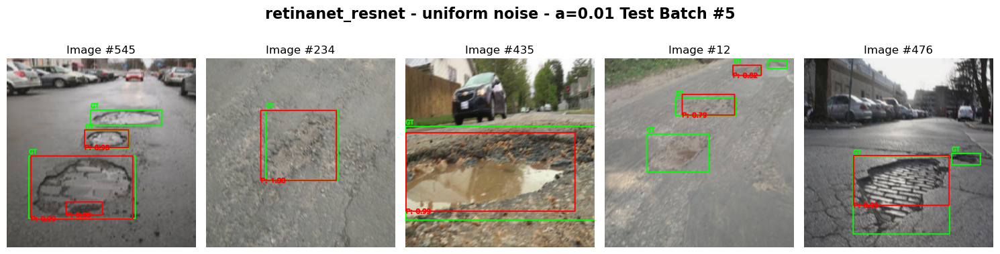

Mean Average Precision @ 0.5 : 0.0000 FPS: 64.60


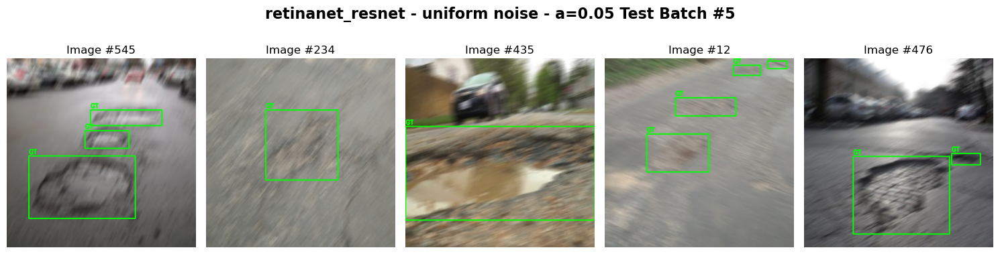

Mean Average Precision @ 0.5 : 0.0007 FPS: 64.25


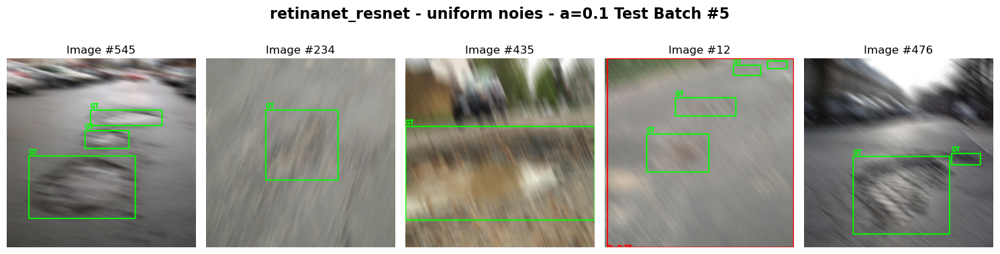

Mean Average Precision @ 0.5 : 0.3578 FPS: 62.42


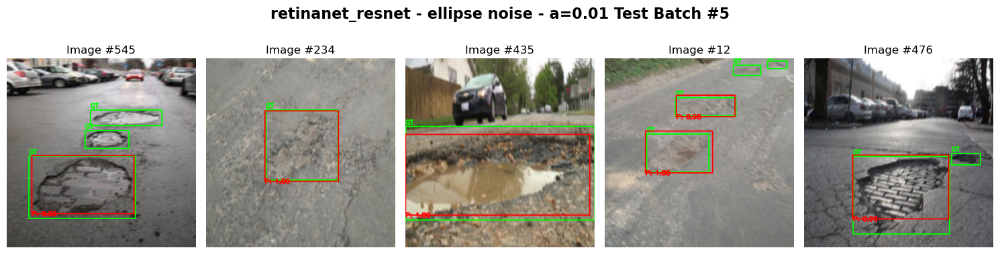

Mean Average Precision @ 0.5 : 0.0033 FPS: 64.44


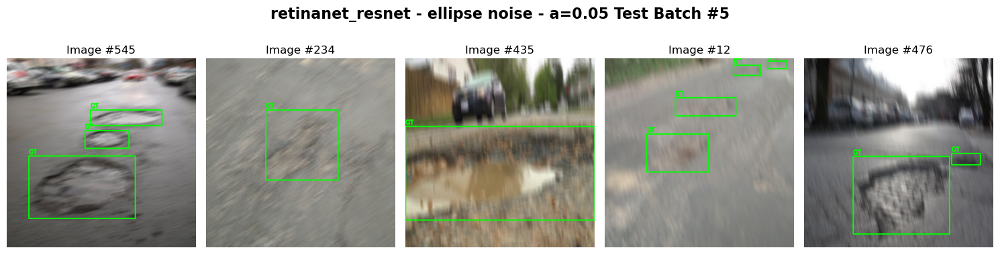

Mean Average Precision @ 0.5 : 0.0011 FPS: 64.31


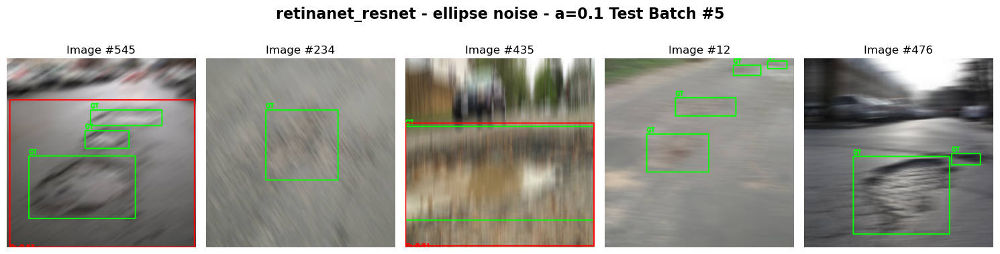

Mean Average Precision @ 0.5 : 0.2408 FPS: 62.73


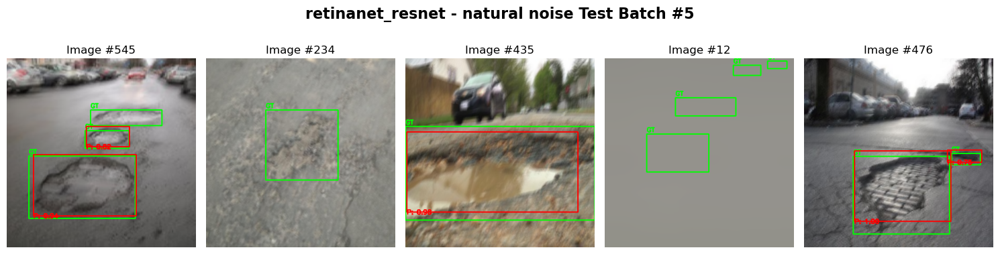

In [5]:
model_name = "retinanet_resnet50_fpn_v2"
model = trainer.get_model(model_name=model_name) 
state_dict = torch.load("data/models/retinanet_resnet50_fpn_v2/retinanet_resnet50_fpn_v2_best.pth", weights_only=True)
model.load_state_dict(state_dict)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)  # Move the model to the GPU
model.eval()  # Set the model to evaluation mode

# test the model
batch_index = 5
history['test_map50'] = evaluator.test_model(model, test_set, index=batch_index, title="retinanet_resnet - clean test")
history['uni001_map50'] = evaluator.test_model(model, test_set_uni_001, index=batch_index, title="retinanet_resnet - uniform noise - a=0.01")
history['uni005_map50'] = evaluator.test_model(model, test_set_uni_005, index=batch_index, title="retinanet_resnet - uniform noise - a=0.05")
history['uni01_map50'] = evaluator.test_model(model, test_set_uni_01, index=batch_index, title="retinanet_resnet - uniform noies - a=0.1")
history['eli001_map50'] = evaluator.test_model(model, test_set_elli_001, index=batch_index, title="retinanet_resnet - ellipse noise - a=0.01")
history['eli005_map50'] = evaluator.test_model(model, test_set_elli_005, index=batch_index, title="retinanet_resnet - ellipse noise - a=0.05")
history['eli01_map50'] = evaluator.test_model(model, test_set_elli_01, index=batch_index, title="retinanet_resnet - ellipse noise - a=0.1")
history['nat_map50'] = evaluator.test_model(model, test_set_nat, index=batch_index, title="retinanet_resnet - natural noise")

In [6]:
# save history to .json file
utils.update_json(history, model_name="retinanet_resnet")

In [7]:
# Train with data augmentation:
trainer.train_from_config(model_config_path="data/models/retinanet_resnet50_fpn_v2/retinanet_resnet50_fpn_v2_best_params.json", train_set=train_set, val_set=val_set, save_path="./data/models/retinanet_resnet50_fpn_v2", kornia_aug=True)

Starting training for retinanet_resnet50_fpn_v2 with the following parameters:
{'batch_size': 4, 'epochs': 19, 'preweight_mode': 'fine_tuning', 'optimizer': 'Adam', 'lr': 0.00013306848141706506, 'beta1': 0.9068693027594908, 'beta2': 0.9382663514975078, 'scheduler': 'CosineAnnealingLR', 'T_max': 9, 'eta_min': 2.2865560690366153e-07}


Epoch 1/19, Train Loss: 86.4931, Val mAP@50: 0.3754, FPS: 60.90, Epoch Time: 22.02 seconds
Epoch 2/19, Train Loss: 59.0572, Val mAP@50: 0.2079, FPS: 61.10, Epoch Time: 21.94 seconds
Epoch 3/19, Train Loss: 54.2724, Val mAP@50: 0.4267, FPS: 60.90, Epoch Time: 22.00 seconds
Epoch 4/19, Train Loss: 45.5158, Val mAP@50: 0.5381, FPS: 60.96, Epoch Time: 22.34 seconds
Epoch 5/19, Train Loss: 39.6559, Val mAP@50: 0.6120, FPS: 60.88, Epoch Time: 22.44 seconds
Epoch 6/19, Train Loss: 38.2280, Val mAP@50: 0.6043, FPS: 61.07, Epoch Time: 22.03 seconds
Epoch 7/19, Train Loss: 31.9615, Val mAP@50: 0.5895, FPS: 61.27, Epoch Time: 22.00 seconds
Epoch 8/19, Train Loss: 28.8200, Val mAP@50: 0.6517, FPS: 61.15, Epoch Time: 22.02 seconds
Epoch 9/19, Train Loss: 29.8921, Val mAP@50: 0.6446, FPS: 61.12, Epoch Time: 22.01 seconds
Epoch 10/19, Train Loss: 27.9132, Val mAP@50: 0.6192, FPS: 61.05, Epoch Time: 22.06 seconds
Epoch 11/19, Train Loss: 28.8437, Val mAP@50: 0.6512, FPS: 60.81, Epoch Time: 22.15 secon

{'train_losses': [86.49308240413666,
  59.057205840945244,
  54.27237883210182,
  45.515764355659485,
  39.655919924378395,
  38.227989584207535,
  31.96152839064598,
  28.819998286664486,
  29.892070397734642,
  27.913242734968662,
  28.843662567436695,
  27.556342013180256,
  28.125100940465927,
  29.20920581370592,
  29.253355786204338,
  30.46430654078722,
  32.33106964826584,
  31.4926520511508,
  29.240822039544582],
 'val_maps': [0.37535998225212097,
  0.20792078971862793,
  0.42669469118118286,
  0.5381335020065308,
  0.6120099425315857,
  0.6042938828468323,
  0.5895344614982605,
  0.651726245880127,
  0.6446281671524048,
  0.6192220449447632,
  0.6512247323989868,
  0.6694832444190979,
  0.6325857043266296,
  0.6587907075881958,
  0.554923415184021,
  0.5802557468414307,
  0.5747491717338562,
  0.5999615788459778,
  0.6590189933776855],
 'best_val_map': 0.6694832444190979,
 'fps': 60.92254642807655,
 'train_time': 420.9498043060303,
 'model_parameters': 36127286,
 'model_size

Mean Average Precision @ 0.5 : 0.5894 FPS: 60.74


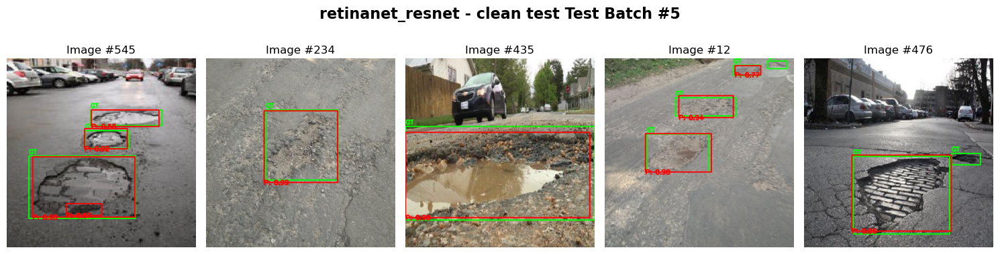

Mean Average Precision @ 0.5 : 0.4979 FPS: 60.80


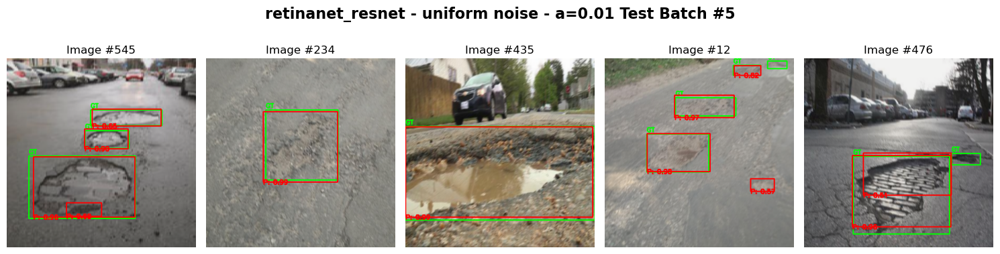

Mean Average Precision @ 0.5 : 0.3791 FPS: 60.79


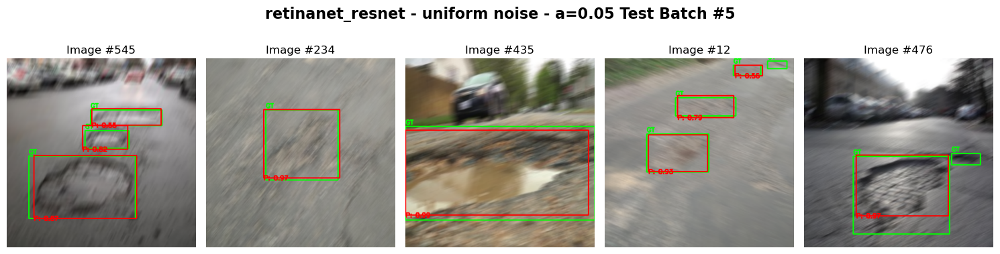

Mean Average Precision @ 0.5 : 0.2492 FPS: 60.88


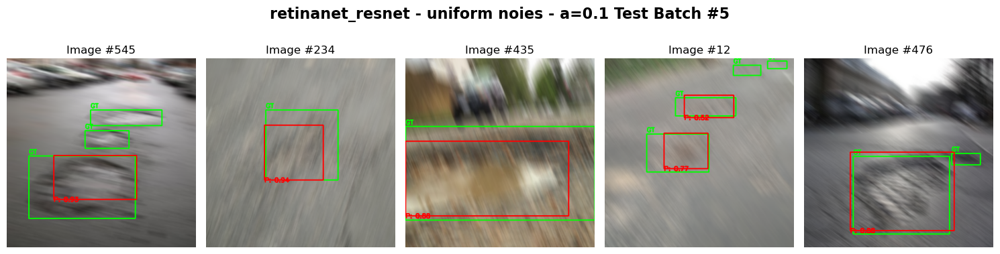

Mean Average Precision @ 0.5 : 0.4806 FPS: 60.98


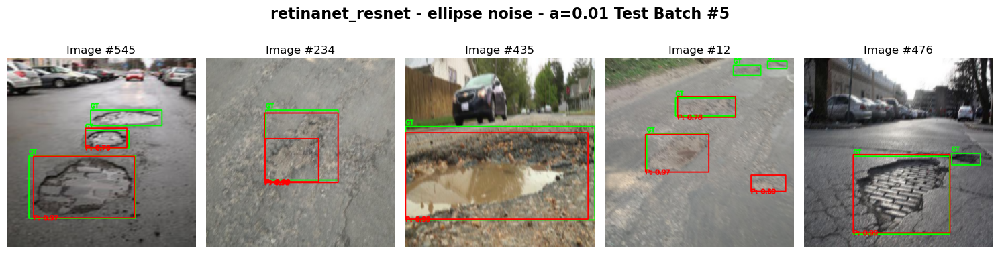

Mean Average Precision @ 0.5 : 0.3714 FPS: 60.80


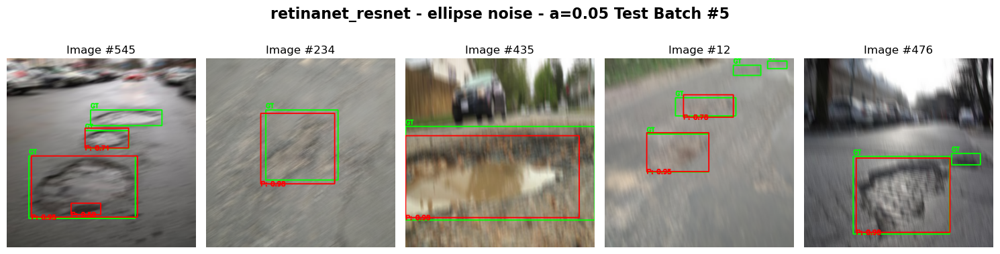

Mean Average Precision @ 0.5 : 0.1949 FPS: 60.90


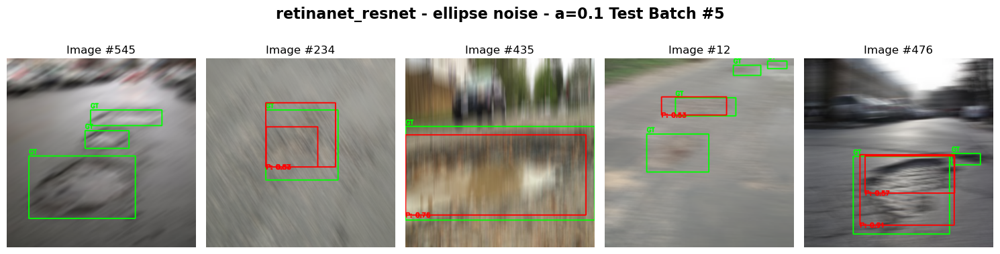

Mean Average Precision @ 0.5 : 0.3851 FPS: 61.05


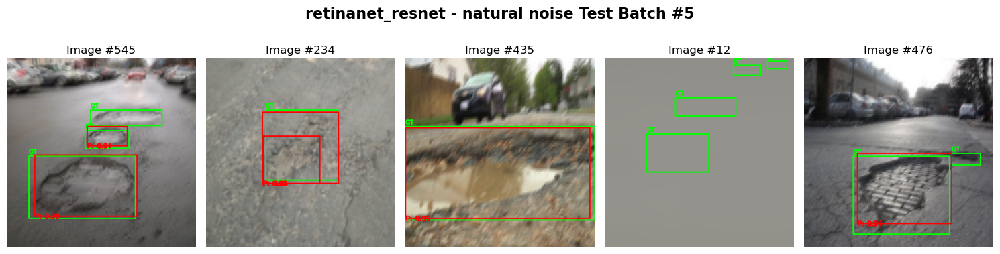

In [8]:
model_name = "retinanet_resnet50_fpn_v2"
model = trainer.get_model(model_name=model_name) 
state_dict = torch.load("data/models/retinanet_resnet50_fpn_v2/retinanet_resnet50_fpn_v2_aug_best.pth", weights_only=True)
model.load_state_dict(state_dict)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)  # Move the model to the GPU
model.eval()  # Set the model to evaluation mode

# test the model
batch_index = 5
history['test_map50'] = evaluator.test_model(model, test_set, index=batch_index, title="retinanet_resnet - clean test")
history['uni001_map50'] = evaluator.test_model(model, test_set_uni_001, index=batch_index, title="retinanet_resnet - uniform noise - a=0.01")
history['uni005_map50'] = evaluator.test_model(model, test_set_uni_005, index=batch_index, title="retinanet_resnet - uniform noise - a=0.05")
history['uni01_map50'] = evaluator.test_model(model, test_set_uni_01, index=batch_index, title="retinanet_resnet - uniform noies - a=0.1")
history['eli001_map50'] = evaluator.test_model(model, test_set_elli_001, index=batch_index, title="retinanet_resnet - ellipse noise - a=0.01")
history['eli005_map50'] = evaluator.test_model(model, test_set_elli_005, index=batch_index, title="retinanet_resnet - ellipse noise - a=0.05")
history['eli01_map50'] = evaluator.test_model(model, test_set_elli_01, index=batch_index, title="retinanet_resnet - ellipse noise - a=0.1")
history['nat_map50'] = evaluator.test_model(model, test_set_nat, index=batch_index, title="retinanet_resnet - natural noise")

In [9]:
# save history to .json file
utils.update_json(history, model_name="retinanet_resnet_aug")